In [ ]:
!pip show tensorflow

Name: tensorflow
Version: 2.7.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.7/dist-packages
Requires: wrapt, h5py, keras, tensorflow-io-gcs-filesystem, astunparse, tensorboard, google-pasta, tensorflow-estimator, opt-einsum, typing-extensions, termcolor, gast, numpy, protobuf, libclang, grpcio, flatbuffers, six, keras-preprocessing, wheel, absl-py
Required-by: kapre


In [ ]:
!python --version

Python 3.7.12


In [ ]:
# !pip install tensorflow==2.2.0
import tensorflow as tf
import os 
import glob 
import xml.etree.ElementTree as ET 
import pandas as pd

In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!ln -s /content/gdrive/My\ Drive/ /mydrive

In [ ]:
!git clone --q https://github.com/tensorflow/models.git

In [ ]:
%cd models/research
!protoc object_detection/protos/*.proto --python_out=.
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .

/content/models/research
Processing /content/models/research
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
     |████████████████████████████████| 9.8 MB 33.9 MB/s 
     |████████████████████████████████| 352 kB 62.2 MB/s 
     |████████████████████████████████| 1.8 MB 39.0 MB/s 
     |████████████████████████████████| 23.1 MB 1.6 MB/s 
     |████████████████████████████████| 1.1 MB 57.7 MB/s 
     |████████████████████████████████| 47.6 MB 71 kB/s 
     |████████████████████████████████| 1.2 MB 33.5 MB/s 
     |████████████████████████████████| 4.9 MB 35.6 MB/s 
     |████████████████████████████████| 99 kB 5.5 MB/s 
     |██████████████████

In [ ]:
!python object_detection/builders/model_builder_tf2_test.py

2021-12-15 17:05:06.468025: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Running tests under Python 3.7.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
W1215 17:05:06.913618 140043175585664 model_builder.py:1100] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 0.75s
I1215 17:05:07.229216 140043175585664 test_util.py:2309] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 0.75s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 0.63s
I1215 17:05:07.858481 140043175585664 test_util.py:2309] time(__main__.ModelBuilderTF2Test.test_cr

In [ ]:
%cd /mydrive/EfficientDet/data/
!unzip /mydrive/EfficientDet/images.zip -d . 
!unzip /mydrive/EfficientDet/annotations.zip -d .

/content/gdrive/My Drive/EfficientDet/data
Archive:  /mydrive/EfficientDet/images.zip
   creating: ./images/
  inflating: ./images/0-with-mask.jpg  
  inflating: ./images/0.jpg          
  inflating: ./images/1-with-mask.jpg  
  inflating: ./images/10-with-mask.jpg  
  inflating: ./images/100-with-mask.jpg  
  inflating: ./images/101-with-mask.jpg  
  inflating: ./images/103-with-mask.jpg  
  inflating: ./images/104-with-mask.jpg  
  inflating: ./images/105-with-mask.jpg  
  inflating: ./images/106-with-mask.jpg  
  inflating: ./images/107-with-mask.jpg  
  inflating: ./images/108-with-mask.jpg  
  inflating: ./images/109-with-mask.jpg  
  inflating: ./images/11-with-mask.jpg  
  inflating: ./images/110-with-mask.jpg  
  inflating: ./images/111-with-mask.jpg  
  inflating: ./images/112-with-mask.jpg  
  inflating: ./images/113-with-mask.jpg  
  inflating: ./images/114-with-mask.jpg  
  inflating: ./images/115-with-mask.jpg  
  inflating: ./images/116-with-mask.jpg  
  inflating: ./imag

In [ ]:
!mkdir test_labels train_labels
!ls annotations/* | sort -R | head -250 | xargs -I{} mv {} test_labels/
!ls annotations/* | xargs -I{} mv {} train_labels/

In [ ]:
def xml_to_csv(path):
  classes_names = []
  xml_list = []

  for xml_file in glob.glob(path + '/*.xml'):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    for member in root.findall('object'):
      classes_names.append(member[0].text)
      value = (root.find('filename').text  ,       
               int(root.find('size')[0].text),
               int(root.find('size')[1].text),
               member[0].text,
               int(member[4][0].text),
               int(member[4][1].text),
               int(member[4][2].text),
               int(member[4][3].text))
      xml_list.append(value)
  column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
  xml_df = pd.DataFrame(xml_list, columns=column_name) 
  classes_names = list(set(classes_names))
  classes_names.sort()
  return xml_df, classes_names

for label_path in ['train_labels', 'test_labels']:
  image_path = os.path.join(os.getcwd(), label_path)
  xml_df, classes = xml_to_csv(label_path)
  xml_df.to_csv(f'{label_path}.csv', index=None)
  print(f'Successfully converted {label_path} xml to csv.')

label_map_path = os.path.join("label_map.pbtxt")
pbtxt_content = ""

for i, class_name in enumerate(classes):
    pbtxt_content = (
        pbtxt_content
        + "item {{\n    id: {0}\n    name: '{1}'\n}}\n\n".format(i + 1, class_name)
    )
pbtxt_content = pbtxt_content.strip()
with open(label_map_path, "w") as f:
    f.write(pbtxt_content)
    print('Successfully created label_map.pbtxt ')

Successfully converted train_labels xml to csv.
Successfully converted test_labels xml to csv.
Successfully created label_map.pbtxt 


In [ ]:
!python /mydrive/EfficientDet/generate_tfrecord.py train_labels.csv  label_map.pbtxt images/ train.record
!python /mydrive/EfficientDet/generate_tfrecord.py test_labels.csv  label_map.pbtxt images/ test.record

groups: 100% 1120/1120 [00:02<00:00, 393.25it/s]
Successfully created the TFRecords: /content/gdrive/My Drive/EfficientDet/data/train.record
groups: 100% 250/250 [00:00<00:00, 412.81it/s]
Successfully created the TFRecords: /content/gdrive/My Drive/EfficientDet/data/test.record


In [ ]:
%cd /mydrive/EfficientDet/data/

/content/gdrive/My Drive/EfficientDet/data


In [ ]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d1_coco17_tpu-32.tar.gz
!tar -xzvf efficientdet_d1_coco17_tpu-32.tar.gz

--2021-12-14 09:51:21--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d1_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.217.219.128, 2607:f8b0:4001:c13::80
Connecting to download.tensorflow.org (download.tensorflow.org)|172.217.219.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 51839363 (49M) [application/x-tar]
Saving to: ‘efficientdet_d1_coco17_tpu-32.tar.gz’

efficientdet_d1_coc 100%[===================>]  49.44M  36.4MB/s    in 1.4s    

2021-12-14 09:51:22 (36.4 MB/s) - ‘efficientdet_d1_coco17_tpu-32.tar.gz’ saved [51839363/51839363]

efficientdet_d1_coco17_tpu-32/
efficientdet_d1_coco17_tpu-32/checkpoint/
efficientdet_d1_coco17_tpu-32/checkpoint/ckpt-0.data-00000-of-00001
efficientdet_d1_coco17_tpu-32/checkpoint/checkpoint
efficientdet_d1_coco17_tpu-32/checkpoint/ckpt-0.index
efficientdet_d1_coco17_tpu-32/pipeline.config
efficientdet_d1_coco17_tpu-32/saved_model/
efficientde

In [ ]:
%load_ext tensorboard 
%tensorboard --logdir '/content/gdrive/MyDrive/EfficientDet/training'

<IPython.core.display.Javascript object>

In [ ]:
%cd /content/models/research/object_detection

/content/models/research/object_detection


In [ ]:
!python model_main_tf2.py --pipeline_config_path=/mydrive/EfficientDet/data/ssd_efficientdet_d1_640x640_coco17_tpu-8.config --model_dir=/mydrive/EfficientDet/training --num_train_steps=200000 --sample_1_of_n_eval_examples=1 --alsologtostderr

2021-12-15 14:38:25.746578: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I1215 14:38:25.754561 139985187870592 mirrored_strategy.py:376] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 200000
I1215 14:38:26.189116 139985187870592 config_util.py:552] Maybe overwriting train_steps: 200000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I1215 14:38:26.189394 139985187870592 config_util.py:552] Maybe overwriting use_bfloat16: False
I1215 14:38:26.204037 139985187870592 ssd_efficientnet_bifpn_feature_extractor.py:143] EfficientDet EfficientNet backbone version: efficientnet-b1
I1215 14:38:26.204181 139985187870592 ssd_efficientnet_bifpn_feature_extractor.py:1

In [ ]:
!python exporter_main_v2.py --input_type image_tensor --pipeline_config_path /mydrive/EfficientDet/data/ssd_efficientdet_d1_640x640_coco17_tpu-8.config --trained_checkpoint_dir /mydrive/EfficientDet/training --output_directory /mydrive/EfficientDet/data/inference_graph

2021-12-15 17:09:11.718784: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
I1215 17:09:12.070126 139817466238848 ssd_efficientnet_bifpn_feature_extractor.py:143] EfficientDet EfficientNet backbone version: efficientnet-b1
I1215 17:09:12.070393 139817466238848 ssd_efficientnet_bifpn_feature_extractor.py:144] EfficientDet BiFPN num filters: 88
I1215 17:09:12.070459 139817466238848 ssd_efficientnet_bifpn_feature_extractor.py:146] EfficientDet BiFPN num iterations: 4
I1215 17:09:12.074767 139817466238848 efficientnet_model.py:147] round_filter input=32 output=32
I1215 17:09:12.100773 139817466238848 efficientnet_model.py:147] round_filter input=32 output=32
I1215 17:09:12.101006 139817466238848 efficientnet_model.py:147] round_filter input=16 output=16
I1215 17:09:12.233962 139817466238848 efficientnet_model.py:147] round_filter input=16 output=16
I1215 17:09:12.234228 139817466238848 efficientnet_model.

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import cv2
from collections import defaultdict
from io import StringIO
from google.colab.patches import cv2_imshow



PATH_TO_SAVED_MODEL = "/content/gdrive/MyDrive/EfficientDet/data/inference_graph/saved_model"
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
PATH_TO_LABELS = '/content/gdrive/MyDrive/EfficientDet/data/label_map.pbtxt'

category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))




Running inference for /content/gdrive/MyDrive/EfficientDet/data/IMG_5806.jpg... 

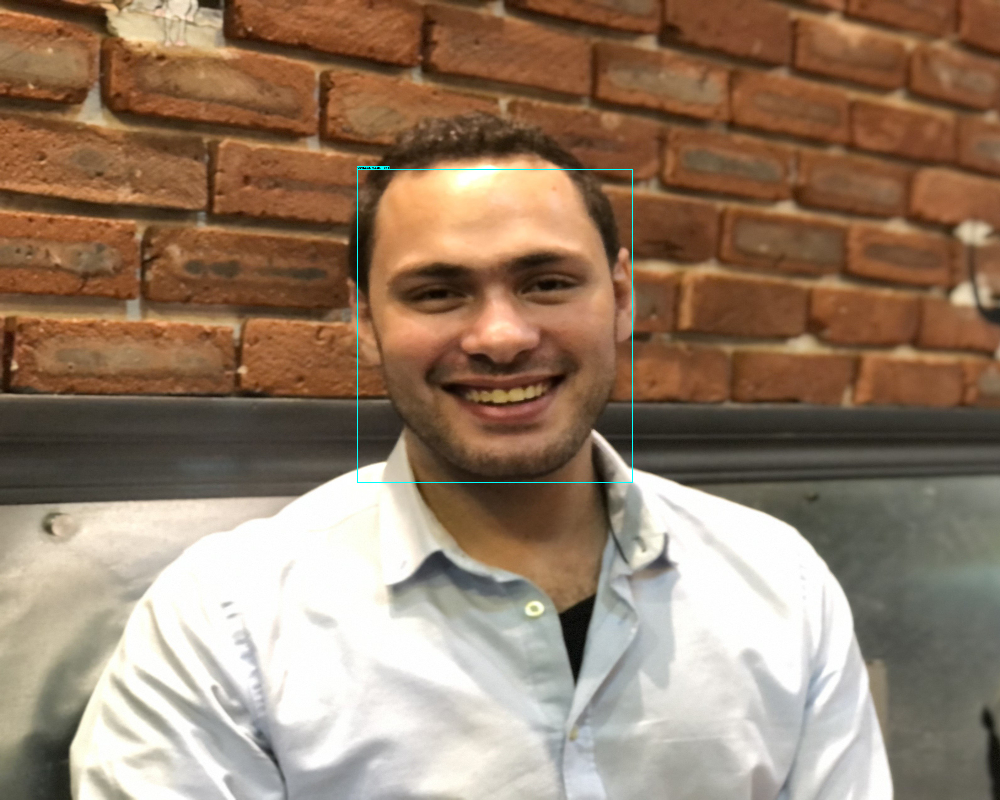

Done
Running inference for /content/gdrive/MyDrive/EfficientDet/data/IMG20211203174753.jpg... 

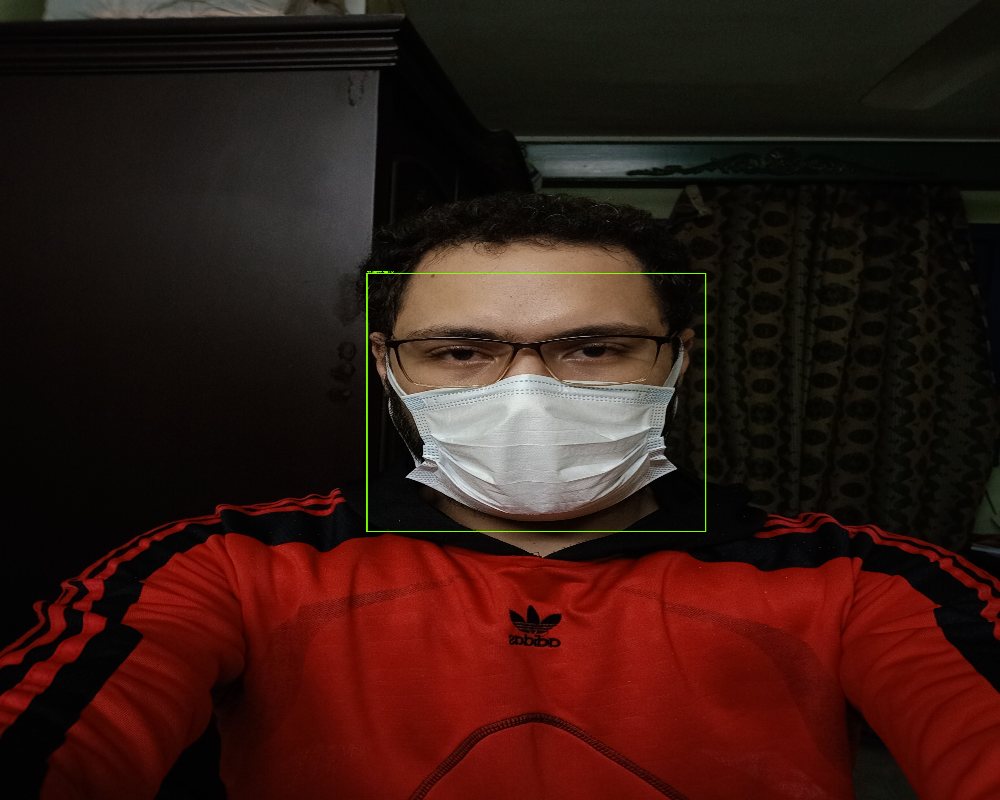

Done
Running inference for /content/gdrive/MyDrive/EfficientDet/data/828383-mask.jpg... 

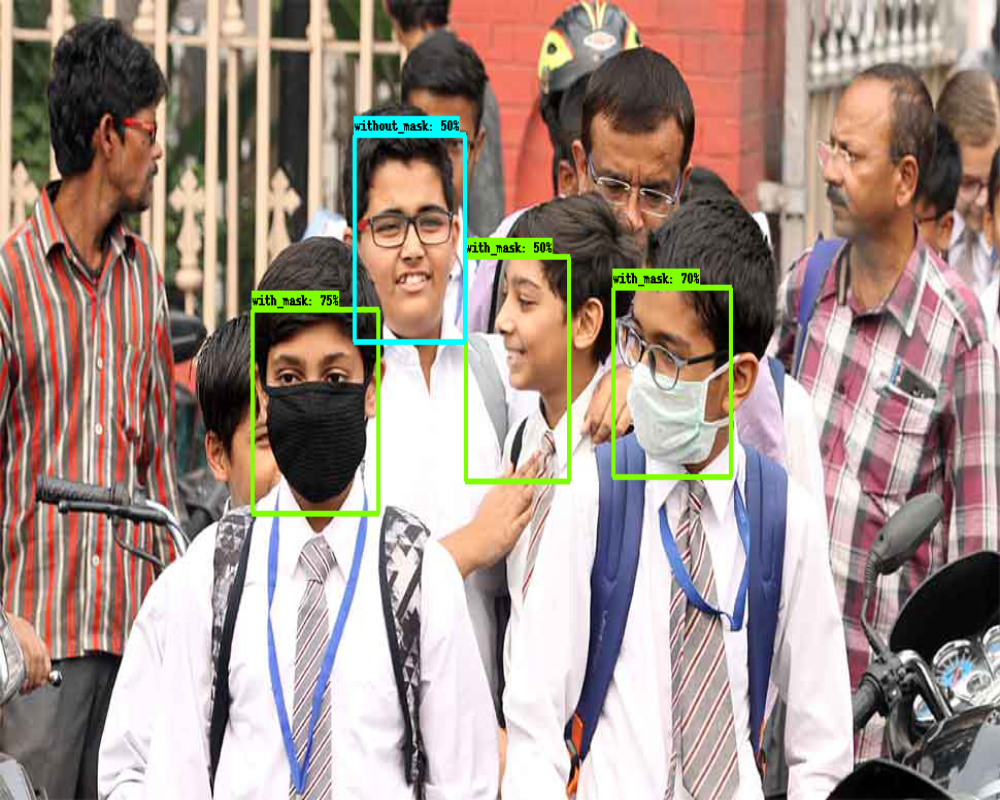

Done
Running inference for /content/gdrive/MyDrive/EfficientDet/data/2020_6$largeimg_776690715.jpg... 

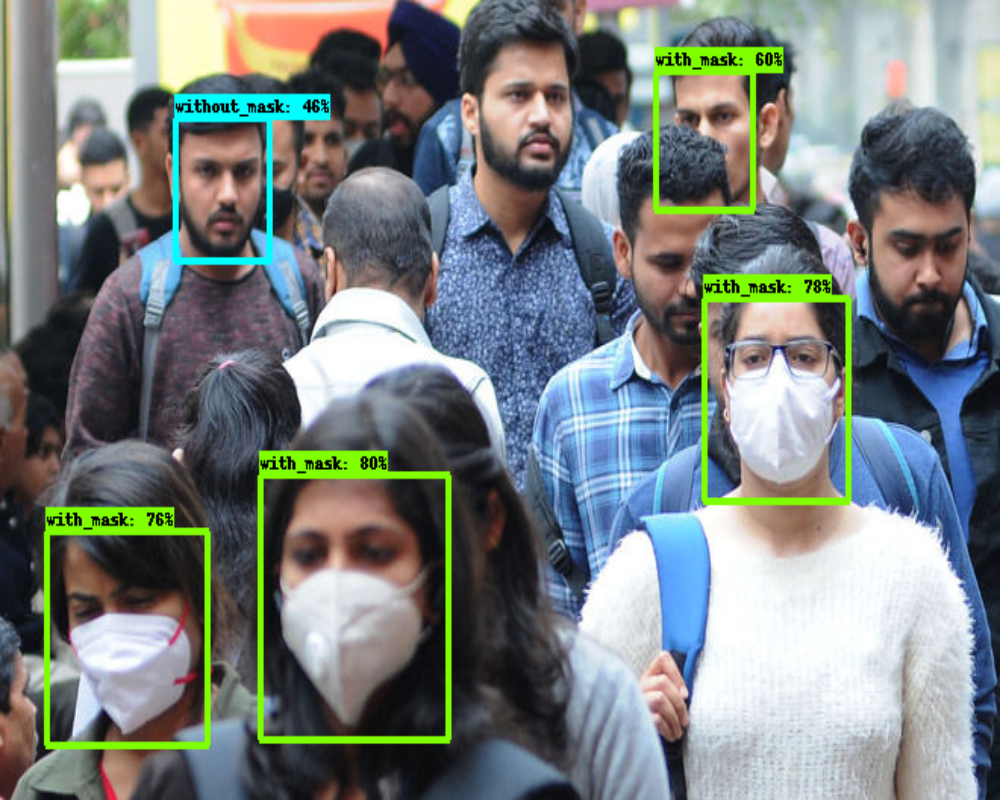

Done


In [20]:
IMAGE_DIR = '/content/gdrive/MyDrive/EfficientDet/data'
IMAGE_PATHS = []
for file in os.listdir(IMAGE_DIR):
  if file.endswith('.jpg'):
    IMAGE_PATHS.append(os.path.join(IMAGE_DIR,file))


for image_path in IMAGE_PATHS:

    print('Running inference for {}... '.format(image_path), end='')

    image_np = load_image_into_numpy_array(image_path)

    # Things to try:
    # Flip horizontally
    # image_np = np.fliplr(image_np).copy()

    # Convert image to grayscale
    # image_np = np.tile(
    #     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image_np)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    # input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                   for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=200,
          min_score_thresh=.45,
          agnostic_mode=False)

    # plt.figure()
    # plt.imshow(image_np_with_detections)
    img=cv2.resize(image_np_with_detections, (1000, 800))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cv2_imshow(img)
    print('Done')
plt.show()

# sphinx_gallery_thumbnail_number = 